In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# import the libraries as shown below
import tensorflow
from tensorflow.keras import layers
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential
import numpy as np
import glob
import matplotlib.pyplot as plt
from keras.models import load_model
import ntpath
from sklearn.metrics import confusion_matrix

In [ ]:
# re-size all the images to this
IMAGE_SIZE = [224, 224]

train_path = '/content/drive/MyDrive/AnimalSkinDiseasePrediciton/Train'
valid_path = '/content/drive/MyDrive/AnimalSkinDiseasePrediciton/Validation'

In [ ]:
# Import the InceptionV3 library as shown below and add preprocessing layer to the front of InceptionV3
# Here we will be using imagenet weights

inception = InceptionV3(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [ ]:
# don't train existing weights
for layer in inception.layers:
    layer.trainable = False

In [ ]:
# useful for getting number of output classes
folders = glob.glob('/content/drive/MyDrive/AnimalSkinDiseasePrediciton/Train')
print(len(folders))

1


In [ ]:
print("Building model with InceptionV3 with imagenet weights")
model = Sequential([
    inception,
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(rate=0.2),
    Dense(4, activation='softmax')  # ตั้งจำนวนหน่วยเป็น 3
])


model.summary()

Building model with InceptionV3 with imagenet weights


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)            │ (None, 5, 5, 2048)          │      21,802,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 51200)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 512)                 │      26,214,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 48,019,748 (183.18 MB)

 Trainable params: 26,216,964 (100.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
# tell the model what cost and optimization method to use
model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [ ]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [ ]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagen.flow_from_directory('/content/drive/MyDrive/AnimalSkinDiseasePrediciton/Train',
                                                 target_size = (224, 224),
                                                 batch_size = 50,
                                                 class_mode = 'categorical')

Found 111 images belonging to 4 classes.


In [ ]:
test_set = test_datagen.flow_from_directory('/content/drive/MyDrive/AnimalSkinDiseasePrediciton/Validation',
                                            target_size = (224, 224),
                                            batch_size = 50,
                                            class_mode = 'categorical')

Found 44 images belonging to 4 classes.


In [ ]:
import datetime

today = datetime.datetime.now()

print(today)

2025-03-07 09:51:27.496714


In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
import pickle

today = datetime.datetime.now()

filepath = "/content/drive/MyDrive/AnimalSkinDiseasePrediciton/model2/model_fit_{epoch:02d}-{val_accuracy:.2f}.keras"
checkpoint1 = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
early = EarlyStopping(monitor="acc", mode="max", patience=15)

callbacks_list = [checkpoint1, early] #early


history = model.fit(
  training_set,
  validation_data=test_set,
  epochs=25,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set),
  callbacks=callbacks_list
)

Epoch 1/25
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.1873 - loss: 68.2802
Epoch 1: val_accuracy improved from -inf to 0.29545, saving model to /content/drive/MyDrive/AnimalSkinDiseasePrediciton/model2/model_fit_01-0.30.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 75s 30s/step - accuracy: 0.1968 - loss: 78.5398 - val_accuracy: 0.2955 - val_loss: 47.2509
Epoch 2/25
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.3125 - loss: 42.1786
Epoch 2: val_accuracy improved from 0.29545 to 0.34091, saving model to /content/drive/MyDrive/AnimalSkinDiseasePrediciton/model2/model_fit_02-0.34.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 46s 10s/step - accuracy: 0.3199 - loss: 42.3254 - val_accuracy: 0.3409 - val_loss: 38.9191
Epoch 3/25
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.3588 - loss: 34.6313
Epoch 3: val_accuracy did not improve from 0.34091
3/3 ━━━━━━━━━━━━━━━━━━━━ 27s 8s/step - accuracy: 0.3682 - loss: 33.6036 - val_accuracy: 0.3182 - val_loss: 26.9311
Epoch 4/25
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - ac

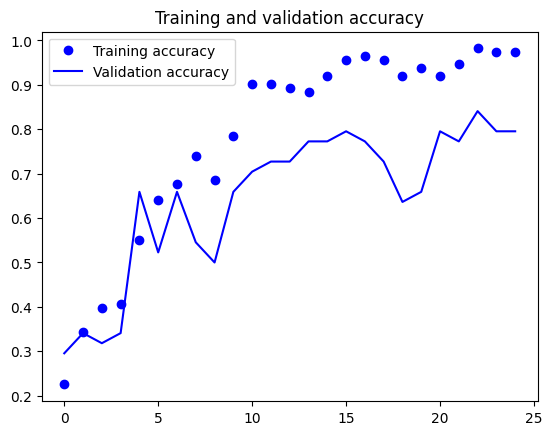

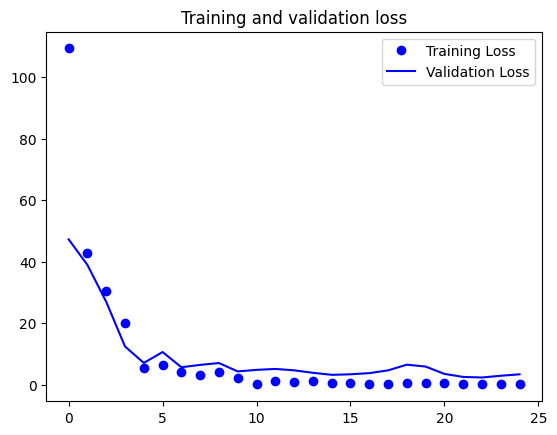

In [ ]:
import matplotlib.pyplot as plt
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in inception.layers[:249]:
    layer.trainable = False
for layer in inception.layers[249:]:
    layer.trainable = True

In [ ]:
print("Building model with InceptionV3 with imagenet weights")
model_finetuned = Sequential([
    inception,
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(rate=0.2),
    Dense(4, activation='softmax')
])

# tell the model what cost and optimization method to use
model_finetuned.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)


model.summary()

Building model with InceptionV3 with imagenet weights


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)            │ (None, 5, 5, 2048)          │      21,802,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 51200)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 512)                 │      26,214,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 100,453,678 (383.20 MB)

 Trainable params: 37,331,844 (142.41 MB)

 Non-trainable params: 10,687,904 (40.77 MB)

 Optimizer params: 52,433,930 (200.02 MB)

In [ ]:
from keras.callbacks import ModelCheckpoint, EarlyStopping
import pickle

filepath = "/content/drive/MyDrive/AnimalSkinDiseasePrediciton/model1/model_finetuned1_{epoch:02d}-{val_accuracy:.2f}.keras"
checkpoint1 = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
early = EarlyStopping(monitor="acc", mode="max", patience=15)

callbacks_list = [checkpoint1, early] #early

history = model_finetuned.fit(
  training_set,
  validation_data=test_set,
  epochs=20,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set),
    callbacks=callbacks_list
)

with open('trainHistoryDict.txt', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

Epoch 1/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.2297 - loss: 19.4376
Epoch 1: val_accuracy improved from -inf to 0.31818, saving model to /content/drive/MyDrive/AnimalSkinDiseasePrediciton/model1/model_finetuned1_01-0.32.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 64s 15s/step - accuracy: 0.2353 - loss: 25.0509 - val_accuracy: 0.3182 - val_loss: 109.1175
Epoch 2/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.3205 - loss: 35.0761  
Epoch 2: val_accuracy improved from 0.31818 to 0.54545, saving model to /content/drive/MyDrive/AnimalSkinDiseasePrediciton/model1/model_finetuned1_02-0.55.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 67s 22s/step - accuracy: 0.3282 - loss: 33.2686 - val_accuracy: 0.5455 - val_loss: 23.2476
Epoch 3/20
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.5821 - loss: 1.2876
Epoch 3: val_accuracy did not improve from 0.54545
3/3 ━━━━━━━━━━━━━━━━━━━━ 39s 11s/step - accuracy: 0.5897 - loss: 1.2376 - val_accuracy: 0.4091 - val_loss: 23.3426
Epoch 4/20
3/3 ━━━━━━━━━━━━━━━━━━━━

In [ ]:
best_model_finetuned = load_model('/content/drive/MyDrive/AnimalSkinDiseasePrediciton/model2/model_fit_23-0.84.keras')

In [ ]:
# Import OpenCV
import cv2

# Utility
import itertools
import random
from collections import Counter
from glob import iglob

test_dir='/content/drive/MyDrive/AnimalSkinDiseasePrediciton/Validation'

def load_image(filename):
    img = cv2.imread(filename)
    img = cv2.resize(img, (IMAGE_SIZE[0], IMAGE_SIZE[1]) )
    img = img /255

    return img

classes=['bacterial', 'fungal', 'healthy', 'hypersensitivity']

def predict(image):
    probabilities = best_model_finetuned.predict(np.asarray([img]))[0]
    class_idx = np.argmax(probabilities)

    return {classes[class_idx]: probabilities[class_idx]}

In [ ]:
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(20,20),text_size=15, norm=False, savefig=True):
    # Create the confustion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
    n_classes = cm.shape[0] # find the number of classes we're dealing with

    # Plot the figure and make it pretty
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
    fig.colorbar(cax)

    # Are there a list of classes?
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    # Label the axes
    ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

    # Make x-axis labels appear on bottom
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    # Set the threshold for different colors
    threshold = (cm.max() + cm.min()) / 2.

    # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
        else:
            plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

    # Save the figure to the current working directory
    if savefig:
        fig.savefig("confusion_matrix.png")

In [ ]:
num_of_test_samples=114

In [ ]:
Y_pred = best_model_finetuned.predict(test_set, num_of_test_samples // 50 + 1)
y_pred = np.argmax(Y_pred, axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


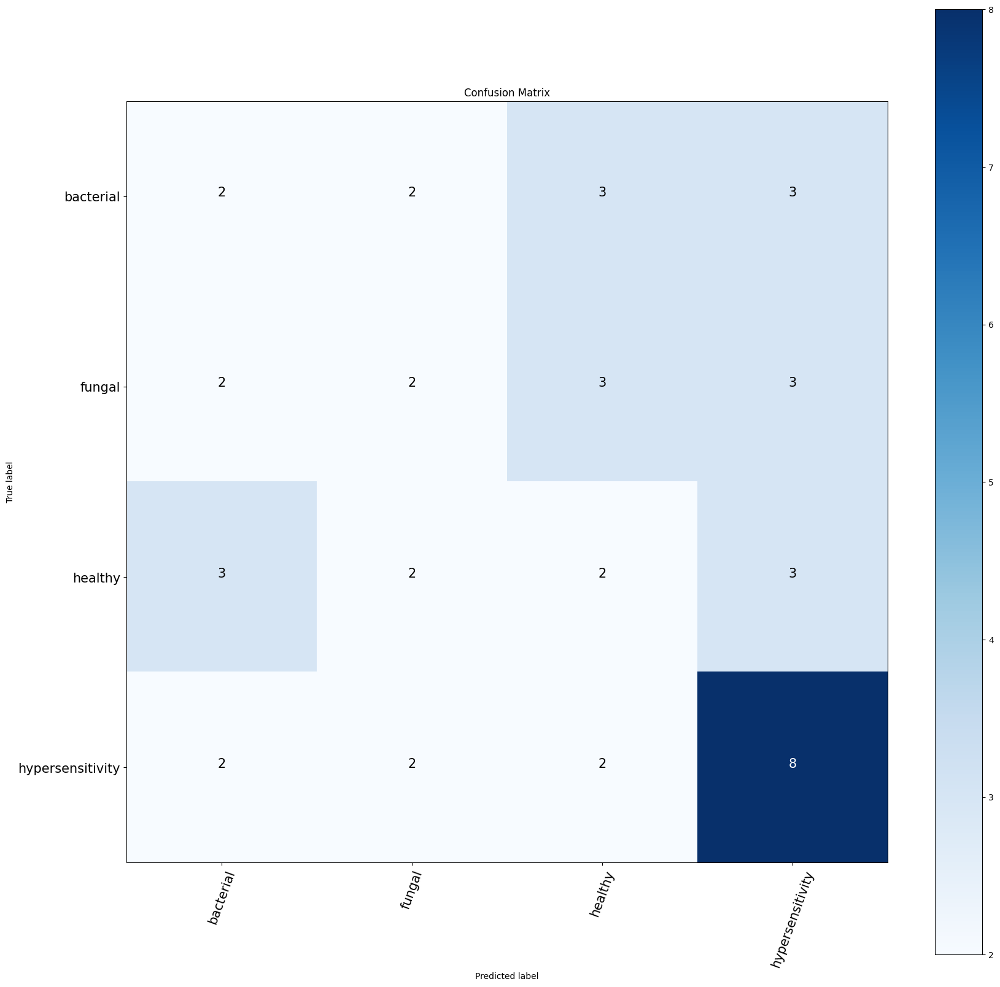

In [ ]:
import os
classes=['bacterial', 'fungal', 'healthy', 'hypersensitivity']
make_confusion_matrix(test_set.classes, y_pred,classes=classes)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
ACTUAL CLASS: 29.jpg, PREDICTED: class: fungal, confidence: 1.000000


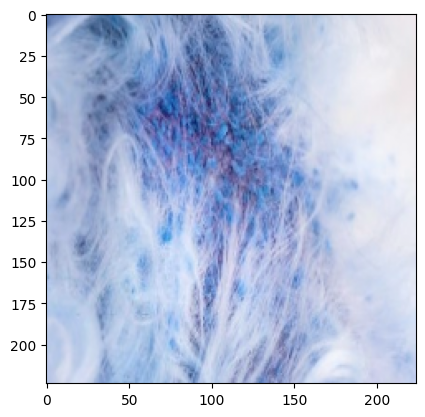

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
ACTUAL CLASS: 27.jpg, PREDICTED: class: fungal, confidence: 0.999174


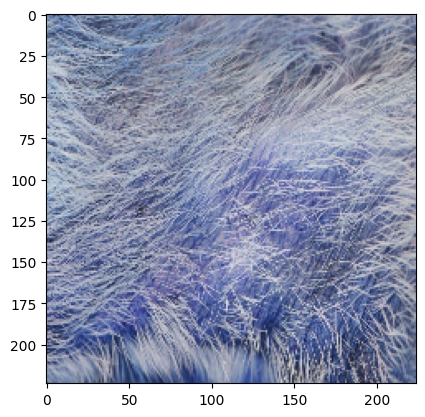

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
ACTUAL CLASS: 31.jpg, PREDICTED: class: hypersensitivity, confidence: 0.698553


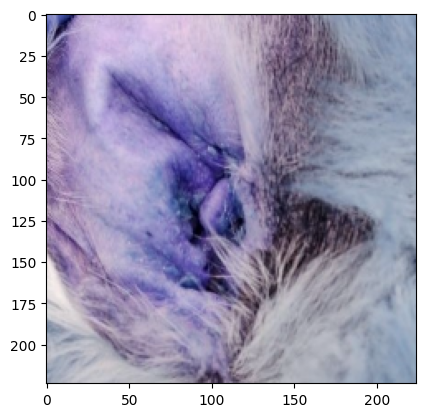

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
ACTUAL CLASS: 34.jpg, PREDICTED: class: bacterial, confidence: 0.913283


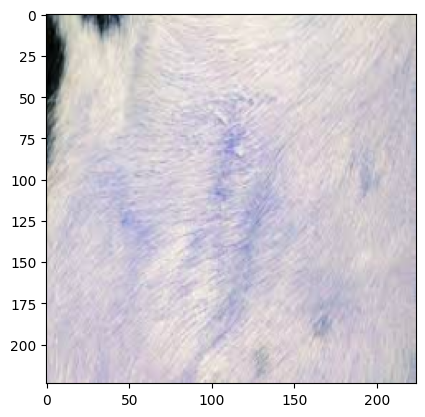

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
ACTUAL CLASS: 26.jpg, PREDICTED: class: fungal, confidence: 1.000000


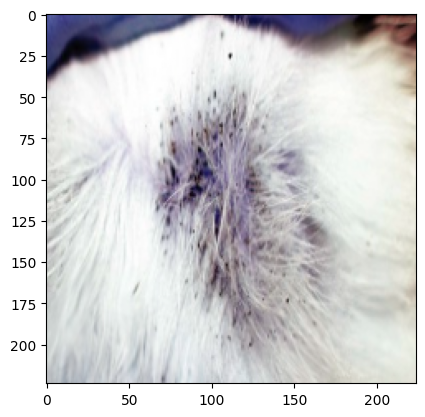

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
ACTUAL CLASS: 30.jpg, PREDICTED: class: fungal, confidence: 1.000000


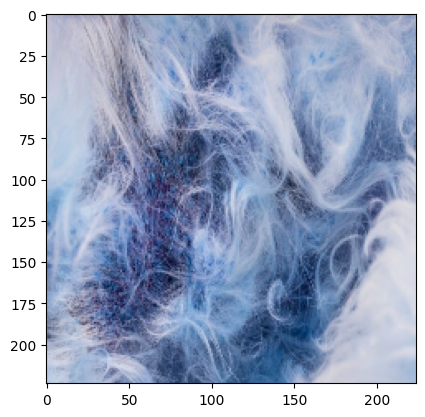

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
ACTUAL CLASS: 32.jpg, PREDICTED: class: bacterial, confidence: 0.998981


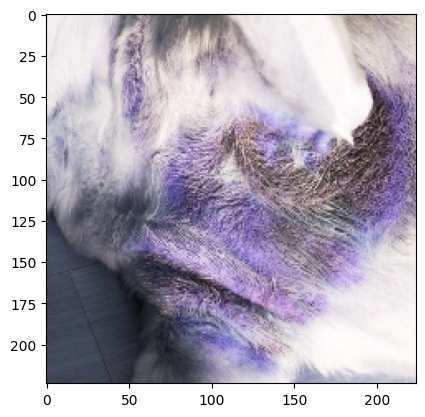

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
ACTUAL CLASS: 28.jpg, PREDICTED: class: fungal, confidence: 1.000000


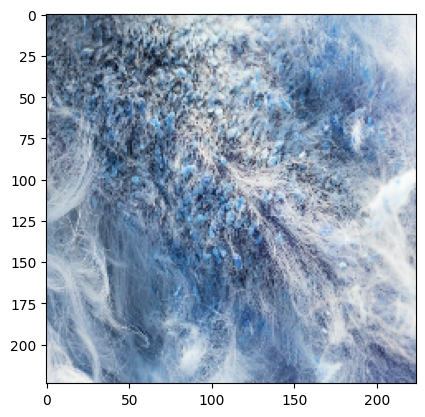

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
ACTUAL CLASS: 35.jpg, PREDICTED: class: fungal, confidence: 1.000000


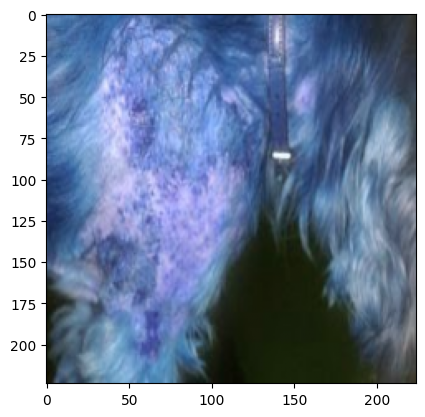

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
ACTUAL CLASS: 33.jpg, PREDICTED: class: fungal, confidence: 0.997559


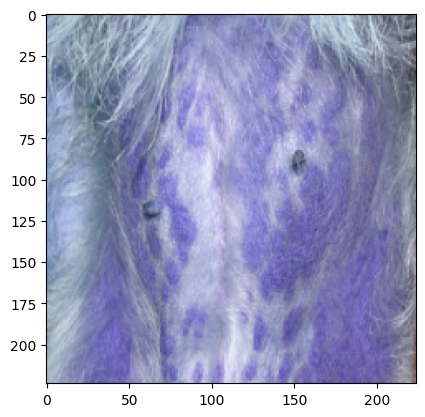

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
ACTUAL CLASS: BD_31.jpg, PREDICTED: class: bacterial, confidence: 1.000000


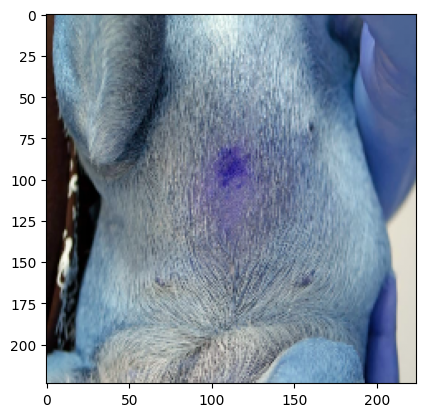

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
ACTUAL CLASS: BD_35.jpg, PREDICTED: class: healthy, confidence: 0.971673


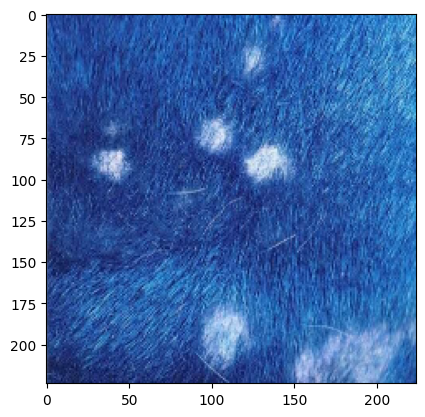

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step
ACTUAL CLASS: 05.jpg, PREDICTED: class: hypersensitivity, confidence: 0.479286


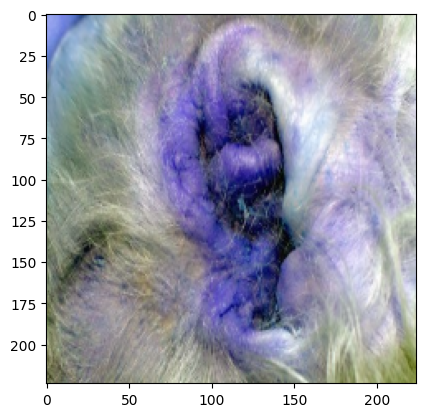

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step
ACTUAL CLASS: 04.jpg, PREDICTED: class: hypersensitivity, confidence: 1.000000


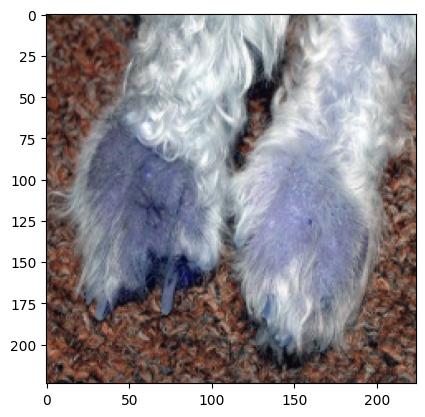

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step
ACTUAL CLASS: 07.jpg, PREDICTED: class: bacterial, confidence: 0.999996


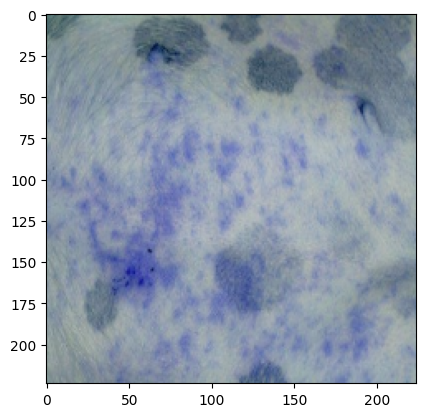

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step
ACTUAL CLASS: 02.jpg, PREDICTED: class: hypersensitivity, confidence: 1.000000


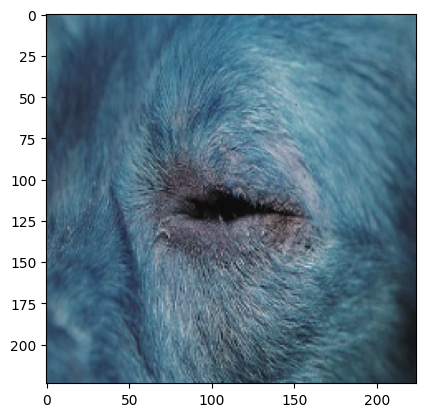

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
ACTUAL CLASS: 01.jpg, PREDICTED: class: hypersensitivity, confidence: 1.000000


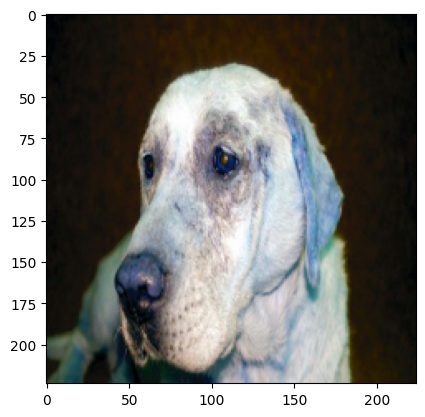

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
ACTUAL CLASS: 12.jpg, PREDICTED: class: hypersensitivity, confidence: 1.000000


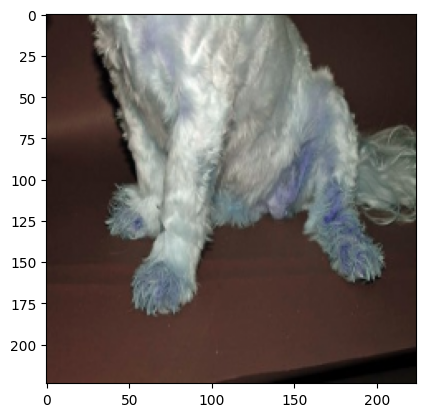

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
ACTUAL CLASS: 16.jpg, PREDICTED: class: hypersensitivity, confidence: 0.919571


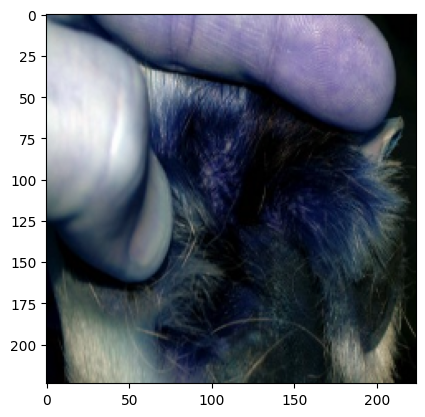

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
ACTUAL CLASS: 09.jpg, PREDICTED: class: hypersensitivity, confidence: 0.985299


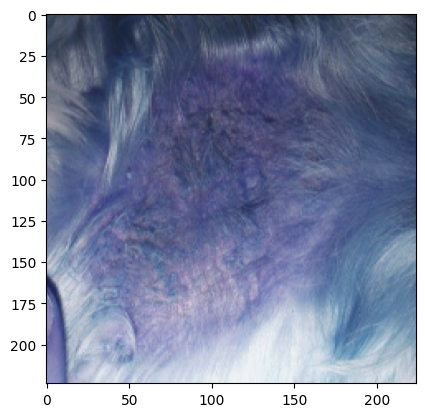

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
ACTUAL CLASS: 19.jpg, PREDICTED: class: hypersensitivity, confidence: 1.000000


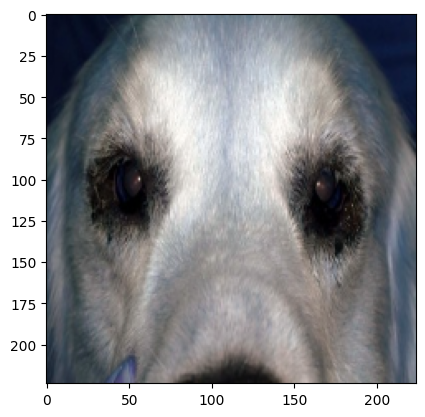

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
ACTUAL CLASS: 10.jpg, PREDICTED: class: hypersensitivity, confidence: 0.999979


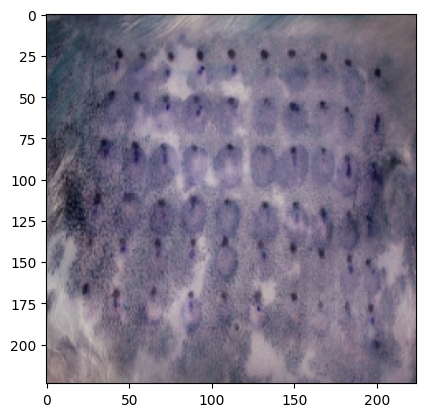

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
ACTUAL CLASS: 26.jpg, PREDICTED: class: hypersensitivity, confidence: 0.999074


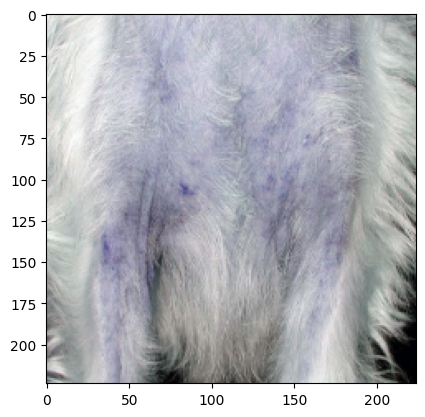

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
ACTUAL CLASS: 32.jpg, PREDICTED: class: hypersensitivity, confidence: 1.000000


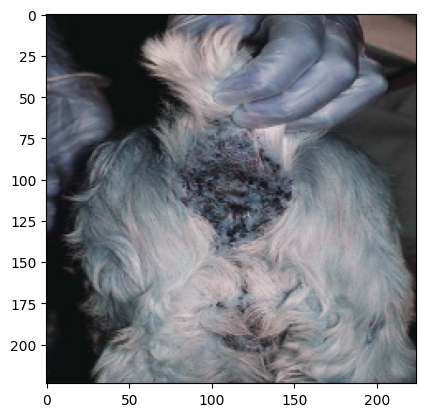

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
ACTUAL CLASS: 34.jpg, PREDICTED: class: healthy, confidence: 0.995611


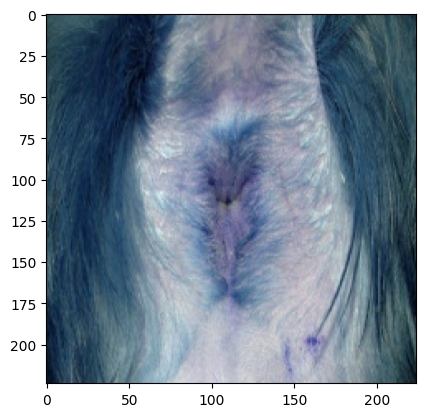

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
ACTUAL CLASS: 23.jpg, PREDICTED: class: hypersensitivity, confidence: 0.761051


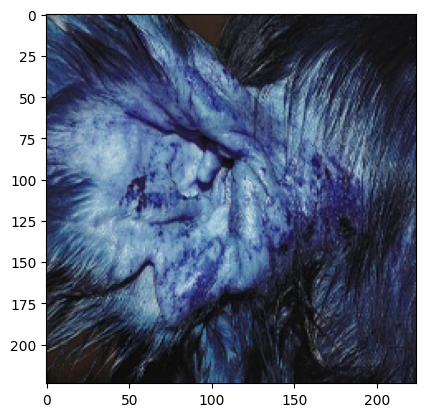

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
ACTUAL CLASS: 06.jpeg, PREDICTED: class: healthy, confidence: 0.975655


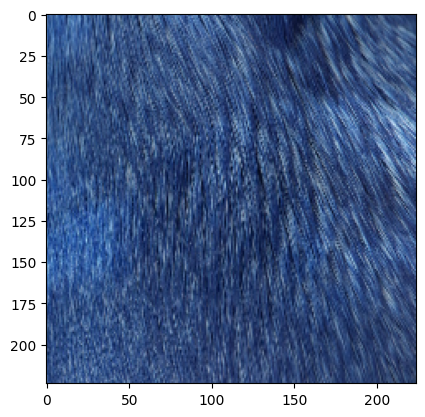

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
ACTUAL CLASS: 02.jpeg, PREDICTED: class: healthy, confidence: 1.000000


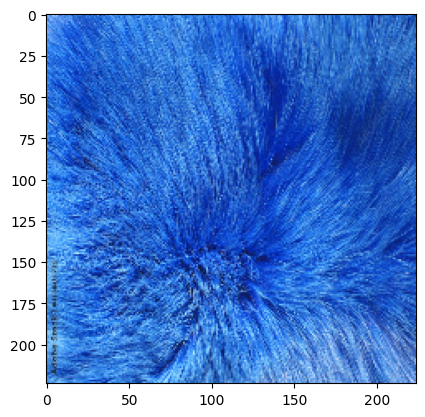

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
ACTUAL CLASS: 05.jpeg, PREDICTED: class: healthy, confidence: 1.000000


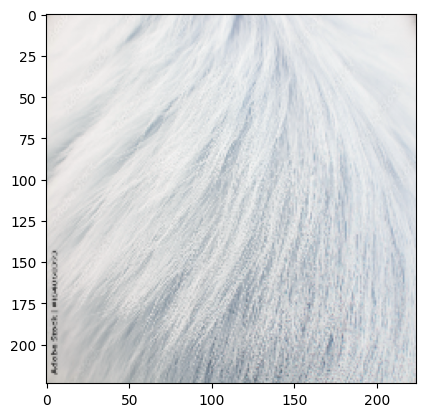

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
ACTUAL CLASS: 04.jpeg, PREDICTED: class: healthy, confidence: 0.974273


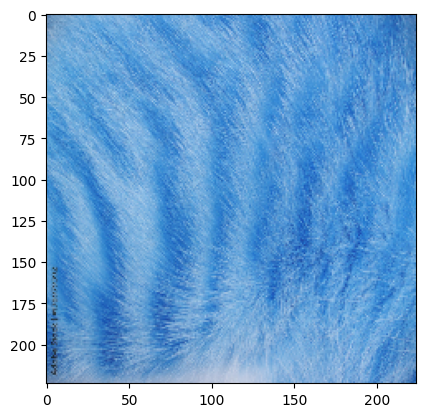

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
ACTUAL CLASS: 09.jpeg, PREDICTED: class: healthy, confidence: 1.000000


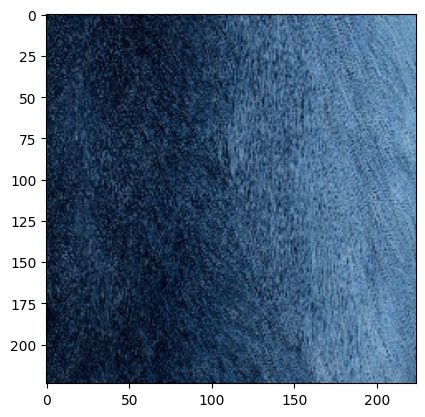

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
ACTUAL CLASS: 08.jpeg, PREDICTED: class: healthy, confidence: 0.999984


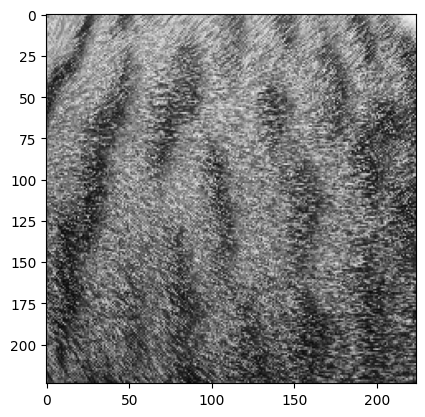

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step
ACTUAL CLASS: 03.jpeg, PREDICTED: class: healthy, confidence: 1.000000


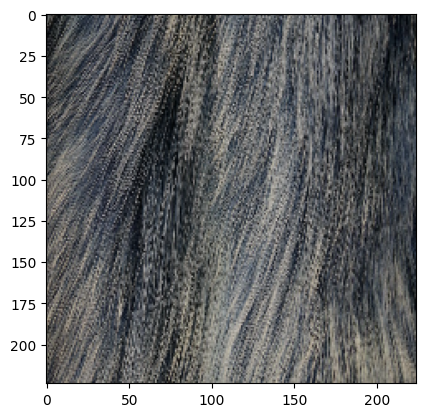

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
ACTUAL CLASS: 10.jpeg, PREDICTED: class: healthy, confidence: 0.999998


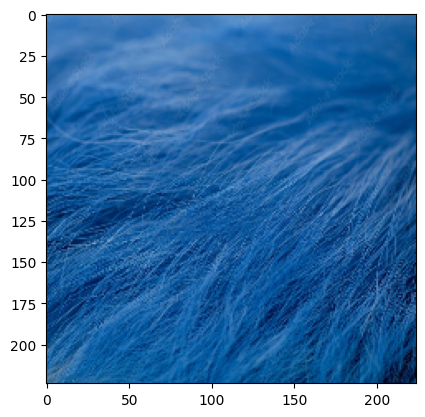

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step
ACTUAL CLASS: 07.jpeg, PREDICTED: class: bacterial, confidence: 0.942726


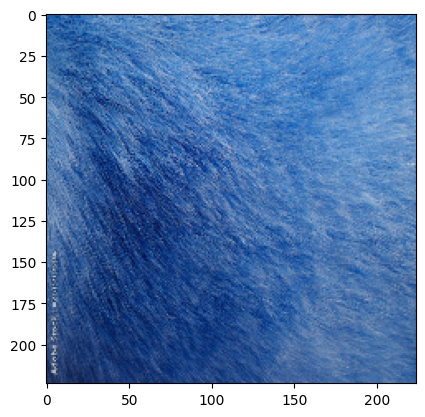

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
ACTUAL CLASS: 01.jpeg, PREDICTED: class: healthy, confidence: 1.000000


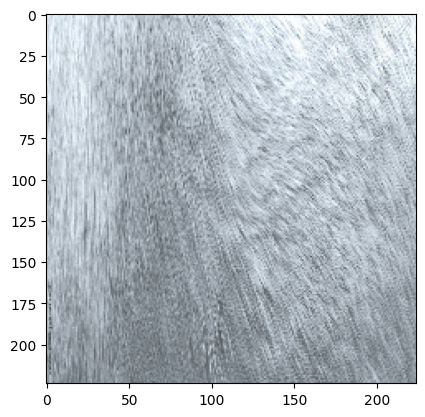

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
ACTUAL CLASS: BD_26.jpeg, PREDICTED: class: bacterial, confidence: 0.999570


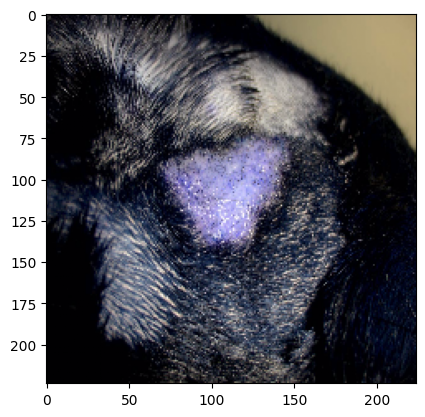

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
ACTUAL CLASS: BD_29.jpeg, PREDICTED: class: hypersensitivity, confidence: 0.999999


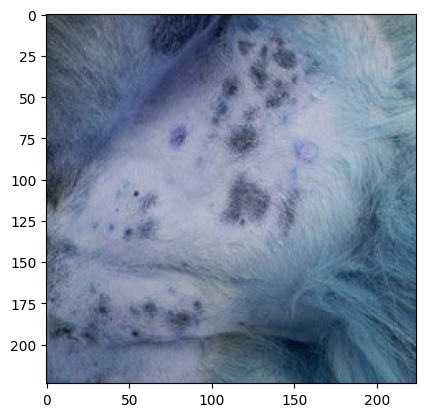

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step
ACTUAL CLASS: BD_32.jpeg, PREDICTED: class: bacterial, confidence: 0.990436


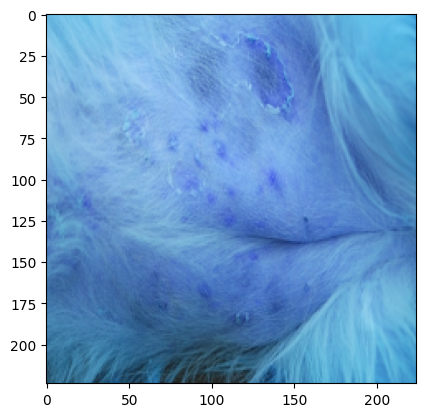

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
ACTUAL CLASS: BD_27.jpeg, PREDICTED: class: bacterial, confidence: 0.663726


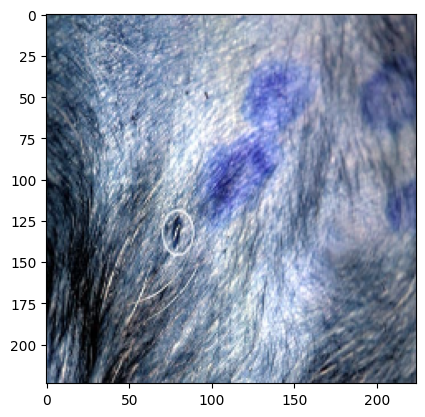

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
ACTUAL CLASS: BD_30.jpeg, PREDICTED: class: bacterial, confidence: 0.999951


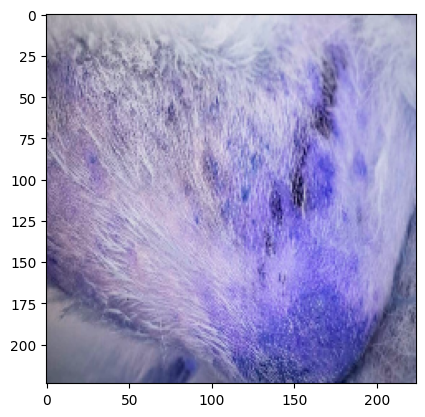

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
ACTUAL CLASS: BD_33.jpeg, PREDICTED: class: bacterial, confidence: 0.997027


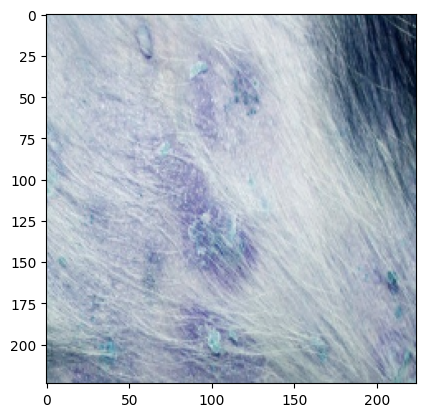

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
ACTUAL CLASS: BD_34.jpeg, PREDICTED: class: bacterial, confidence: 0.991502


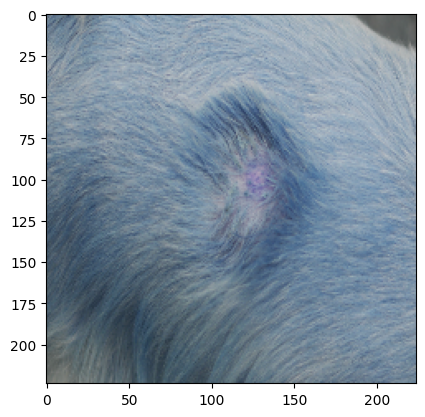

In [ ]:
path ='/content/drive/MyDrive/AnimalSkinDiseasePrediciton/Validation'
PList=glob.glob('/content/drive/MyDrive/AnimalSkinDiseasePrediciton/Validation/*/*.jpg') + glob.glob('/content/drive/MyDrive/AnimalSkinDiseasePrediciton/Validation/*/*.jpeg')
for filename in PList:
    img = load_image(str(filename))
    prediction = predict(img)
    print("ACTUAL CLASS: %s, PREDICTED: class: %s, confidence: %f" % (os.path.basename(filename), list(prediction.keys())[0], list(prediction.values())[0]))
    plt.imshow(img)
    plt.show()